<a href="https://colab.research.google.com/github/Aushinraj/Data-Science-Capstone-Project-The-Battle-Of-Neighborhoods/blob/main/Code(Jupyter%20notebook).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# COURSERA CAPSTONE PROJECT: **FINDING THE BEST SPOT TO START A RESTAURANT IN NYC**

**Import all required Libraries**

In [ ]:
import numpy as np
import pandas as pd
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
import requests
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier  #importing KNN library
from pandas import json_normalize  # tranforming json file into a pandas dataframe library

**Define Foursquare Credentials and Version**

In [ ]:
CLIENT_ID = 'XXXXXXXXXXXXXXXXXX'# your Foursquare ID
CLIENT_SECRET = 'XXXXXXXXXXXXXX' # your Foursquare Secret
VERSION = 'XXXXXXXX'           # Foursquare API version


**Getting the Location of Address**

In [ ]:
address = 'NEW YORK CITY'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print(latitude, longitude)

40.7127281 -74.0060152


In [ ]:
search_query = 'Hotel'
radius = 500
limit_hotels = 50

In [ ]:
#Generating url for making the API call
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, limit_hotels)
url

'https://api.foursquare.com/v2/venues/search?client_id=REZHBJKA5QZFZ5DDNU4X50IDMD4WK0ECXQXYOUAWAQBPAL1P&client_secret=2QDU2YE3I0LZMFHQL53GXUEVLD0QOQ0HNE4QR1SC5VNA5Y5L&ll=40.7127281,-74.0060152&v=20180605&query=Hotel&radius=500&limit=50'

**Send Get Request for result**

In [ ]:
#making the call and holding the resulting json file in results

results = requests.get(url).json()

**Get relevant part of JSON and transform it into a pandas dataframe**

In [ ]:
# assign relevant part of JSON to hotels
hotels = results['response']['venues']

# tranform venues into a dataframe
hotels_df = json_normalize(hotels)
hotels_df.head()

,id,name,categories,referralId,hasPerk,location.address,location.crossStreet,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,venuePage.id,location.neighborhood
0,56d8c0f8498edb854f926e6a,"The Beekman, A Thompson Hotel","[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",v-1623055881,False,123 Nassau St,Beekman St,40.711173,-74.006702,"[{'label': 'display', 'lat': 40.7111725, 'lng'...",182,10038,US,New York,NY,United States,"[123 Nassau St (Beekman St), New York, NY 1003...",NaN,NaN
1,57c640ad498e74977f98372f,Four Seasons Hotel New York Downtown,"[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",v-1623055881,False,27 Barclay St,Broadway,40.712612,-74.009380,"[{'label': 'display', 'lat': 40.71261246501983...",284,10007,US,New York,NY,United States,"[27 Barclay St (Broadway), New York, NY 10007,...",NaN,NaN
2,4a6e3e75f964a5204ed41fe3,"Gild Hall, A Thompson Hotel","[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",v-1623055881,False,15 Gold St,at Platt St,40.707887,-74.007103,"[{'label': 'display', 'lat': 40.7078871, 'lng'...",546,10038,US,New York,NY,United States,"[15 Gold St (at Platt St), New York, NY 10038,...",NaN,NaN
3,5a91fa58e679bc57ca94db72,Artezen Hotel,"[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",v-1623055881,False,24 John St,NaN,40.709585,-74.008780,"[{'label': 'display', 'lat': 40.709585, 'lng':...",420,10038,US,New York,NY,United States,"[24 John St, New York, NY 10038, United States]",563082986,NaN
4,4ae77379f964a5206cab21e3,Duane Street Hotel,"[{'id': '4bf58dd8d48988d1fa931735', 'name': 'H...",v-1623055881,False,130 Duane St,Church St,40.715858,-74.007446,"[{'label': 'display', 'lat': 40.7158584594727,...",368,10013,US,New York,NY,United States,"[130 Duane St (Church St), New York, NY 10013,...",40822074,NaN


**Cleaning The Dataframe**

In [ ]:
# keep only columns that include venue name,categories,lat,lng
filtered_columns = ['name', 'categories','location.lat','location.lng']
hotels_df_filtered = hotels_df.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
hotels_df_filtered['categories'] = hotels_df_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
hotels_df_filtered.columns = [column.split('.')[-1] for column in hotels_df_filtered.columns]

hotels_df_filtered

,name,categories,lat,lng
0,"The Beekman, A Thompson Hotel",Hotel,40.711173,-74.006702
1,Four Seasons Hotel New York Downtown,Hotel,40.712612,-74.009380
2,"Gild Hall, A Thompson Hotel",Hotel,40.707887,-74.007103
3,Artezen Hotel,Hotel,40.709585,-74.008780
4,Duane Street Hotel,Hotel,40.715858,-74.007446
5,Cosmopolitan Hotel - TriBeCa,Hotel,40.715622,-74.009115
6,Smyth Hotel,Hotel,40.715144,-74.009183
7,Spa @ Four Seasons Hotel New York Downtown,Spa,40.712801,-74.009245
8,The Angel Hotel,None,40.712441,-74.007118
9,Millenium Baileys Hotel,None,40.712305,-74.007118


In [ ]:
#keeping only venues with the category "Hotel"

hotels_df_filtered = hotels_df_filtered[hotels_df_filtered.categories == 'Hotel']
hotels_df_filtered.reset_index(drop=True, inplace=True)
hotels_df_filtered.head()

,name,categories,lat,lng
0,"The Beekman, A Thompson Hotel",Hotel,40.711173,-74.006702
1,Four Seasons Hotel New York Downtown,Hotel,40.712612,-74.009380
2,"Gild Hall, A Thompson Hotel",Hotel,40.707887,-74.007103
3,Artezen Hotel,Hotel,40.709585,-74.008780
4,Duane Street Hotel,Hotel,40.715858,-74.007446


**Folium Map To View The Hotels In NewYork**

In [ ]:
#creating a map to view the resulting hotels and their locations
hotels_map = folium.Map(location=[latitude, longitude], zoom_start=15) # generate map centred around New York

# add the hotels as blue circle markers
for lat, lng, label in zip(hotels_df_filtered.lat, hotels_df_filtered.lng, hotels_df_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(hotels_map)

# display map
hotels_map

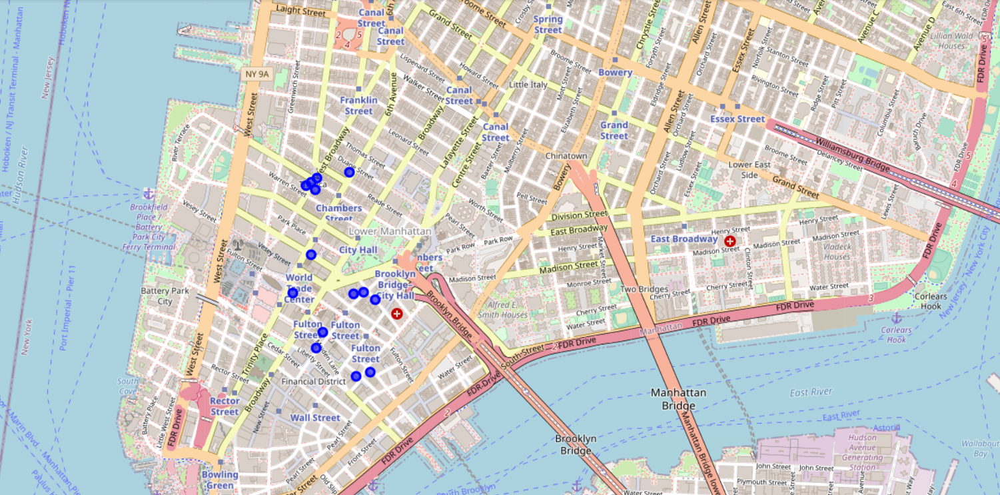

In [ ]:
#How many hotels are there near newyork city center?
hotels_df_filtered.shape[0]

14

In [ ]:
#Adding an id number to each venue will help in re-assembling the data after clustering
hotels_df_filtered['id']=np.arange(1,(hotels_df_filtered.shape[0])+1)
hotels_df_filtered

,name,categories,lat,lng,id
0,"The Beekman, A Thompson Hotel",Hotel,40.711173,-74.006702,1
1,Four Seasons Hotel New York Downtown,Hotel,40.712612,-74.009380,2
2,"Gild Hall, A Thompson Hotel",Hotel,40.707887,-74.007103,3
3,Artezen Hotel,Hotel,40.709585,-74.008780,4
4,Duane Street Hotel,Hotel,40.715858,-74.007446,5
5,Cosmopolitan Hotel - TriBeCa,Hotel,40.715622,-74.009115,6
6,Smyth Hotel,Hotel,40.715144,-74.009183,7
7,Archer Hotel,Hotel,40.710860,-74.006101,8
8,JC's Hotel New York,Hotel,40.711080,-74.007229,9
9,The Frederick Hotel,Hotel,40.715460,-74.009383,10


In [ ]:
# The dataset that will be used in K-Means clustering
X=hotels_df_filtered.loc[:,['id','lat','lng']]
X.head(10)

,id,lat,lng
0,1,40.711173,-74.006702
1,2,40.712612,-74.009380
2,3,40.707887,-74.007103
3,4,40.709585,-74.008780
4,5,40.715858,-74.007446
5,6,40.715622,-74.009115
6,7,40.715144,-74.009183
7,8,40.710860,-74.006101
8,9,40.711080,-74.007229
9,10,40.715460,-74.009383


## **Clustering The Hotels using Kmeans**

In [ ]:
#clustering the hotels based on their locations 
kmeans = KMeans(n_clusters = 3, init ='k-means++') # hotels will be clustered in 3 groups
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
centers = kmeans.cluster_centers_
print(centers) #to show coordinates of the center for each cluster 
X.head(10)

[[ 40.70980691 -74.00669725]
 [ 40.71548148 -74.00895632]
 [ 40.71057204 -74.00940412]]


,id,lat,lng,cluster_label
0,1,40.711173,-74.006702,0
1,2,40.712612,-74.009380,2
2,3,40.707887,-74.007103,0
3,4,40.709585,-74.008780,2
4,5,40.715858,-74.007446,1
5,6,40.715622,-74.009115,1
6,7,40.715144,-74.009183,1
7,8,40.710860,-74.006101,0
8,9,40.711080,-74.007229,0
9,10,40.715460,-74.009383,1


In [ ]:
#Adding the cluster label to each venue in the hotels data frame
X = X[['id','cluster_label']]
clustered_hotels = hotels_df_filtered.merge(X, left_on='id',right_on='id')
clustered_hotels.head()

,name,categories,lat,lng,id,cluster_label
0,"The Beekman, A Thompson Hotel",Hotel,40.711173,-74.006702,1,0
1,Four Seasons Hotel New York Downtown,Hotel,40.712612,-74.009380,2,2
2,"Gild Hall, A Thompson Hotel",Hotel,40.707887,-74.007103,3,0
3,Artezen Hotel,Hotel,40.709585,-74.008780,4,2
4,Duane Street Hotel,Hotel,40.715858,-74.007446,5,1


**Folium Map Of Hotels After Clustering**

In [ ]:
#map showing each hotel with different color based on the cluster
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=15)

# add markers to the map
marker_colors = ['red','green','blue']
for lat, lon, poi, cluster in zip(clustered_hotels['lat'], clustered_hotels['lng'], clustered_hotels['name'], clustered_hotels['cluster_label']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=marker_colors[cluster],
        fill=True,
        fill_color=marker_colors[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters #show map

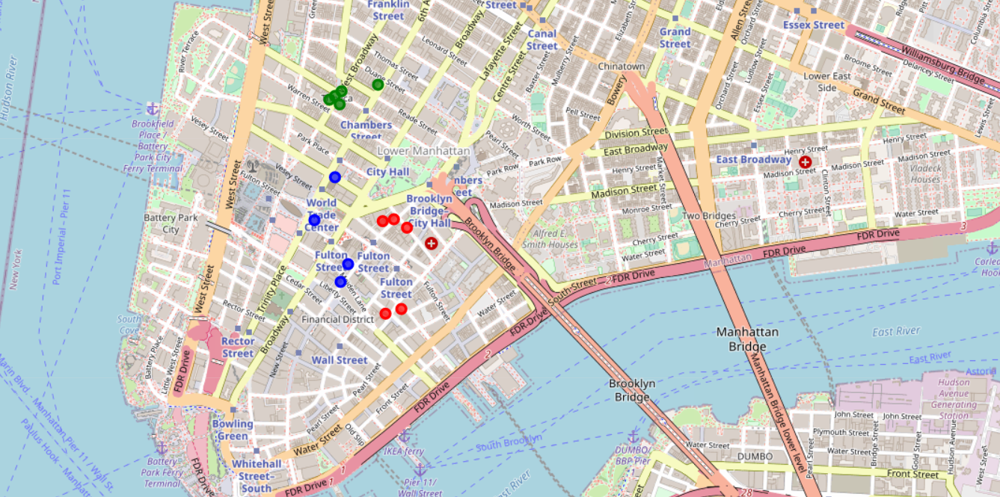

In [ ]:
#Keeping the center of each cluster in a dataframe for later analysis
centers_df = pd.DataFrame(centers, columns =['c_lat', 'c_lon'])
cluster_label = list(range(0,3))
centers_df['cluster_label'] = cluster_label
centers_df

,c_lat,c_lon,cluster_label
0,40.709807,-74.006697,0
1,40.715481,-74.008956,1
2,40.710572,-74.009404,2


**Map Of Center of each cluster**

In [ ]:
#map of centers
map_centers = folium.Map(location=[latitude, longitude], zoom_start=15)

# add markers to the map in different colors according to cluster
marker_colors = ['red','green','blue']
for lat, lon, poi, cluster in zip(centers_df['c_lat'], centers_df['c_lon'], centers_df['cluster_label'], centers_df['cluster_label']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=marker_colors[cluster],
        fill=True,
        fill_color=marker_colors[cluster],
        fill_opacity=0.7).add_to(map_centers)
       
map_centers #display the map showing 3 markers, one for each cluster 

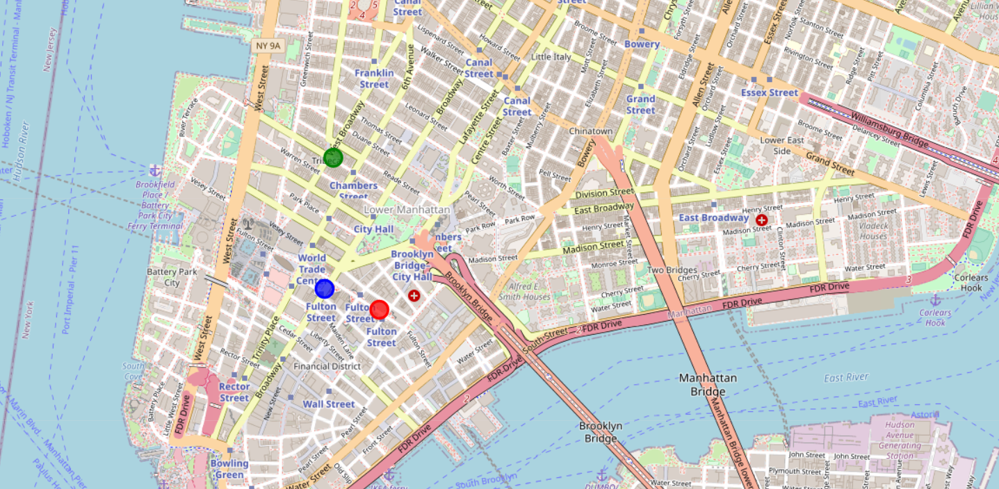

## **Getting the restaurants data from Foursquare And Analysing the Data**

In [ ]:
#creating the url to call on foursquare API

limit_restaurants = 500

url2 = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    limit_restaurants)
url2

'https://api.foursquare.com/v2/venues/explore?&client_id=REZHBJKA5QZFZ5DDNU4X50IDMD4WK0ECXQXYOUAWAQBPAL1P&client_secret=2QDU2YE3I0LZMFHQL53GXUEVLD0QOQ0HNE4QR1SC5VNA5Y5L&v=20180605&ll=40.7127281,-74.0060152&radius=500&limit=500'

In [ ]:
#saving the results
results2 = requests.get(url2).json()

**Cleaning The restaurant data**

In [ ]:
#getting the needed data and put it in a pandas dataframe
restaurants = results2['response']['groups'][0]['items']
    
restaurants_df = json_normalize(restaurants) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
restaurants_df = restaurants_df.loc[:, filtered_columns]

# filter the category for each row
restaurants_df['venue.categories'] = restaurants_df.apply(get_category_type, axis=1)

# clean columns
restaurants_df.columns = [col.split(".")[-1] for col in restaurants_df.columns]

restaurants_df

,name,categories,lat,lng
0,The Bar Room at Temple Court,Hotel Bar,40.711448,-74.006802
1,"The Beekman, A Thompson Hotel",Hotel,40.711173,-74.006702
2,Alba Dry Cleaner & Tailor,Laundry Service,40.711434,-74.006272
3,City Hall Park,Park,40.712359,-74.007493
4,The Class by Taryn Toomey,Gym / Fitness Center,40.712753,-74.008734
...,...,...,...,...
83,Auntie Anne's,Snack Place,40.710721,-74.008416
84,AT&T Store,Mobile Phone Shop,40.713651,-74.009625
85,WW (Weight Watchers),Weight Loss Center,40.709102,-74.009273
86,Church & Dey,Hotel Bar,40.711423,-74.011005


In [ ]:
#number of venues recieved
restaurants_df.shape[0]

88

In [ ]:
#keeping only the venues with categories containing "Restaurant"
restaurants_df_cleaned = restaurants_df[restaurants_df['categories'].str.contains('Restaurant')].reset_index(drop=True)
print(restaurants_df_cleaned.shape) #number of restaurants
restaurants_df_cleaned.head()

(16, 4)


,name,categories,lat,lng
0,The Hummus & Pita Co,Falafel Restaurant,40.714453,-74.006853
1,Racines,French Restaurant,40.714754,-74.007581
2,Nish Nūsh,Falafel Restaurant,40.715537,-74.007725
3,Sophie's Cuban Cuisine,Cuban Restaurant,40.714803,-74.007656
4,Nobu Downtown,Japanese Restaurant,40.710773,-74.009580


**Folium Map of Restaurants near New York**

In [ ]:
#creating a map of restaurants
restaurants_map = folium.Map(location=[latitude, longitude], zoom_start=15) # generate map centred around New York

# add the hotels as orange circle markers
for lat, lng, label in zip(restaurants_df_cleaned.lat, restaurants_df_cleaned.lng, restaurants_df_cleaned.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='orange',
        popup=label,
        fill = True,
        fill_color='orange',
        fill_opacity=0.6
    ).add_to(restaurants_map)

# display map
restaurants_map

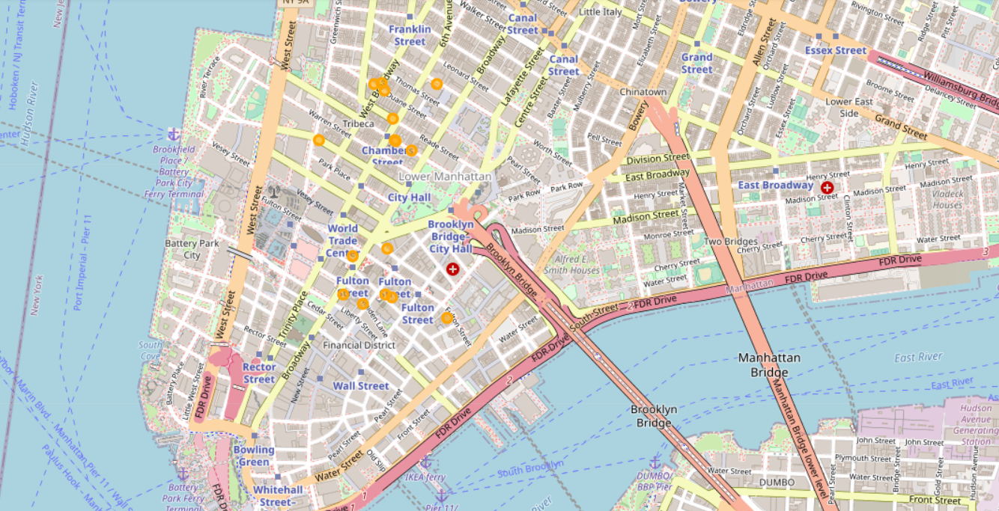

## **KNN Classification of Restaurants**

In [ ]:
#preparing the data that will be used in KNN classification
Xhat=restaurants_df_cleaned.loc[:,['lat','lng']] #classification based on the location coordinates
print(Xhat.shape) #number of restaurants
Xhat.head(10) #show dataframe

(16, 2)


,lat,lng
0,40.714453,-74.006853
1,40.714754,-74.007581
2,40.715537,-74.007725
3,40.714803,-74.007656
4,40.710773,-74.009580
5,40.711028,-74.007965
6,40.709418,-74.008056
7,40.716752,-74.005712
8,40.716526,-74.008101
9,40.709337,-74.007769


In [ ]:
#the centers dataframe to be used for training KNN
centers_df 

,c_lat,c_lon,cluster_label
0,40.709807,-74.006697,0
1,40.715481,-74.008956,1
2,40.710572,-74.009404,2


In [ ]:
#selecting classification features and target variable
X_train = centers_df[['c_lat', 'c_lon']].values
Y_train = centers_df['cluster_label']

In [ ]:
k = 1 #classification based on the nearest center
#Train Model and Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,Y_train)
neigh

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [ ]:
#classify the restaurants based on the model created
yhat = neigh.predict(Xhat)
yhat[0:5]

array([1, 1, 1, 1, 2])

In [ ]:
#putting the results in a dataframe
KNN_results = pd.DataFrame(yhat, columns=['class'])
KNN_results

,class
0,1
1,1
2,1
3,1
4,2
5,2
6,0
7,1
8,1
9,0


In [ ]:
#joining the results with the restaurants dataframe
restaurants_classified = pd.concat([restaurants_df_cleaned, KNN_results], axis=1, sort=False)
restaurants_classified

,name,categories,lat,lng,class
0,The Hummus & Pita Co,Falafel Restaurant,40.714453,-74.006853,1
1,Racines,French Restaurant,40.714754,-74.007581,1
2,Nish Nūsh,Falafel Restaurant,40.715537,-74.007725,1
3,Sophie's Cuban Cuisine,Cuban Restaurant,40.714803,-74.007656,1
4,Nobu Downtown,Japanese Restaurant,40.710773,-74.009580,2
5,Pita Express,Middle Eastern Restaurant,40.711028,-74.007965,2
6,Nish Nush,Falafel Restaurant,40.709418,-74.008056,0
7,Atera,Molecular Gastronomy Restaurant,40.716752,-74.005712,1
8,Takahachi,Sushi Restaurant,40.716526,-74.008101,1
9,Maestro Pasta,Italian Restaurant,40.709337,-74.007769,0


In [ ]:
#show restaurants in each area in different color
map_rest_class = folium.Map(location=[latitude, longitude], zoom_start=15)

# add markers to the map
marker_colors = ['red','green','blue']
for lat, lon, poi, cluster in zip(restaurants_classified['lat'], restaurants_classified['lng'], restaurants_classified['name'], restaurants_classified['class']):
    label = folium.Popup(str(poi) + ' Class ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=marker_colors[cluster],
        fill=True,
        fill_color=marker_colors[cluster],
        fill_opacity=0.7).add_to(map_rest_class)
       
map_rest_class

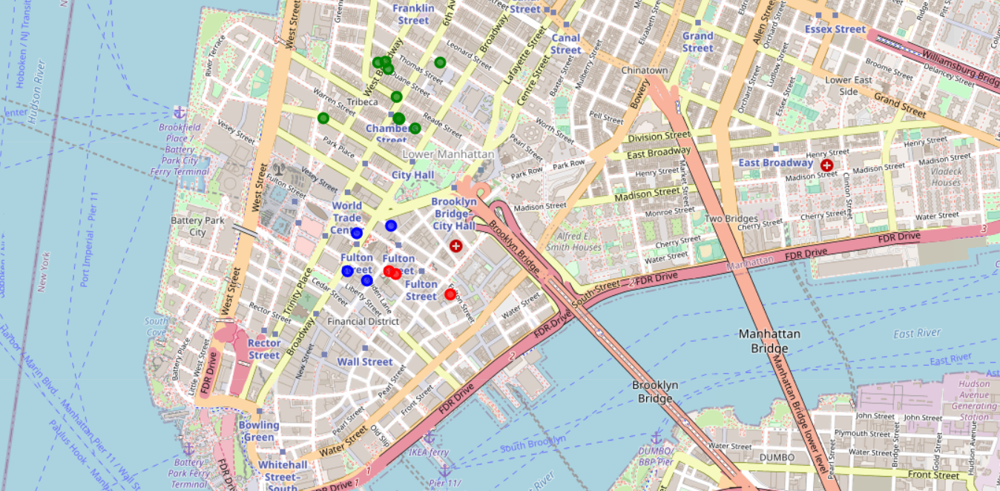

## **Finding the suitable spot And The Trending Food TYPE**

In [ ]:
#count number of restaurants in each area
restaurants_count = restaurants_classified['class'].value_counts().rename_axis('class').reset_index(name='counts')
restaurants_count

,class,counts
0,1,9
1,2,4
2,0,3


In [ ]:
#counting number of trending restaurants of each unique category
trending_restaurants = restaurants_classified['categories'].value_counts().rename_axis('categories').reset_index(name='counts')
trending_restaurants

,categories,counts
0,Falafel Restaurant,3
1,French Restaurant,2
2,Middle Eastern Restaurant,1
3,Restaurant,1
4,Japanese Restaurant,1
5,Sushi Restaurant,1
6,American Restaurant,1
7,Indian Restaurant,1
8,Italian Restaurant,1
9,Asian Restaurant,1


In [ ]:
#keeping the five most frequent categories
trending_restaurants = trending_restaurants.head()
trending_restaurants

,categories,counts
0,Falafel Restaurant,3
1,French Restaurant,2
2,Middle Eastern Restaurant,1
3,Restaurant,1
4,Japanese Restaurant,1


In [ ]:
#make "categories" as index for visiualization
trending_restaurants = trending_restaurants.set_index('categories')
trending_restaurants

,counts
categories,
Falafel Restaurant,3
French Restaurant,2
Middle Eastern Restaurant,1
Restaurant,1
Japanese Restaurant,1


## **TRENDING FOOD TYPE**

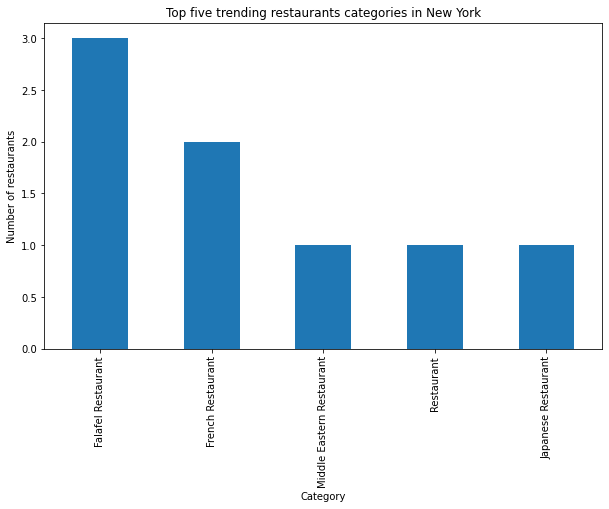

In [ ]:
#plotting the top five restaurant categories
trending_restaurants.plot(kind='bar', figsize=(10, 6), legend=None)

plt.xlabel('Category') # add to x-label to the plot
plt.ylabel('Number of restaurants') # add y-label to the plot
plt.title('Top five trending restaurants categories in New York') # add title to the plot

plt.show()

In [ ]:
#counting hotels in each area to evaluate potential
hotels_count = clustered_hotels['cluster_label'].value_counts().rename_axis('cluster').reset_index(name='counts')
hotels_count

,cluster,counts
0,1,5
1,0,5
2,2,4


In [ ]:
restaurants_count=restaurants_count.rename(columns={"class":"Region","counts":"res_count"})
restaurants_count

,Region,res_count
0,1,9
1,2,4
2,0,3


In [ ]:
hotels_count=hotels_count.rename(columns={"cluster":"Region","counts":"hotel_count"})
hotels_count

,Region,hotel_count
0,1,5
1,0,5
2,2,4


In [ ]:
res = pd.merge(restaurants_count, hotels_count,on="Region")
res.sort_values("Region",ignore_index=True,inplace=True)
res

,Region,res_count,hotel_count
0,0,3,5
1,1,9,5
2,2,4,4


## **Ratio of Restaurants to Hotels in a Region**

In [ ]:
ratio=res.res_count/res.hotel_count
res["Ratio"]=ratio
res

,Region,res_count,hotel_count,Ratio
0,0,3,5,0.6
1,1,9,5,1.8
2,2,4,4,1.0


## **Result / Conclusion**
It is found that the region 0(red) has the lowest ratio for number of restaurants to number of hotels and Falafel as the trending food type around the region. Thus the best spot for starting a restaurant is the red region and the best food type to serve is Falafel.